In [1]:
import json
import datetime
import pandas as pd

# Load JSON data from file
with open('conversations.json', 'r') as file:
    data = json.load(file)

# Prepare a list to hold message dictionaries
messages = []

# Extract messages and their creation times from the data
for conversation in data:
    for key, value in conversation['mapping'].items():
        if value['message'] and 'parts' in value['message']['content'] and all(isinstance(part, str) for part in value['message']['content']['parts']):
            # Join parts if they are all strings
            text = ' '.join(value['message']['content']['parts'])
            # Extract create_time and convert from milliseconds to seconds
            if value['message']['create_time']:
                create_time = datetime.datetime.fromtimestamp(value['message']['create_time'])
            else:
                create_time = None
            # Append the dictionary of message and create_time to the list
            messages.append({'message': text, 'create_time': create_time, 'role': value['message']['author']['role']})

# Print the list of message dictionaries
print(messages)


[{'message': '', 'create_time': None, 'role': 'system'}, {'message': 'Can you explain this to me?', 'create_time': datetime.datetime(2024, 4, 29, 18, 32, 1, 211017), 'role': 'user'}, {'message': "Of course! I'd be happy to help. Could you please provide more context or specify what you'd like me to explain?", 'create_time': datetime.datetime(2024, 4, 29, 18, 32, 5, 624934), 'role': 'assistant'}, {'message': 'Example. One might expect that when X and Y are jointly continuous, then E[X | Y ]\nis a continuous random variable, but this is not the case. To see this, suppose that X\nand Y are independent, in which case E[X | Y = y] = E[X], which also implies that\nE[X | Y ] = E[X]. Thus, E[X | Y ] takes a constant value, and is therefore a trivial case\nof a discrete random variable.', 'create_time': datetime.datetime(2024, 4, 29, 18, 32, 12, 690198), 'role': 'user'}, {'message': 'Certainly! Let\'s break down the explanation:\n\n1. **Joint Continuity of X and Y**: When we say that X and Y ar

In [2]:
def count_words(strings):
    total_words = sum(len(st['message'].split()) for st in strings)
    return total_words

# Printing the total number of words
total_words = count_words(messages)
print(f"Total number of words: {total_words}")

Total number of words: 140777


In [3]:
from gensim import corpora, models
import gensim

# Preparing the text data
texts = [[word for word in document['message'].lower().split()] for document in messages]

# Creating a corpus from the texts
dictionary = corpora.Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]

# Applying LDA
lda_model = gensim.models.ldamodel.LdaModel(corpus, num_topics=30, id2word=dictionary, passes=15)

# Viewing the topics
topics = lda_model.print_topics(num_words=4)
for topic in topics:
    print(topic)


(24, '0.050*"the" + 0.016*"in" + 0.013*"do" + 0.013*"are"')
(11, '0.046*"the" + 0.038*"to" + 0.022*"a" + 0.022*"and"')
(28, '0.050*"the" + 0.030*"to" + 0.023*"a" + 0.023*"and"')
(21, '0.024*"<<" + 0.022*"//" + 0.018*"=" + 0.014*"cuda"')
(15, '0.020*"(rectangular" + 0.017*"prism)" + 0.009*"(cylinder)" + 0.008*"9."')
(5, '0.021*"=" + 0.017*"and" + 0.014*"the" + 0.013*"for"')
(7, '0.045*"the" + 0.033*"to" + 0.023*"of" + 0.020*"and"')
(9, '0.017*"the" + 0.016*"to" + 0.015*"a" + 0.012*"and"')
(10, '0.039*"and" + 0.023*"-" + 0.019*"customer" + 0.018*"the"')
(16, '0.027*"=" + 0.018*"p(n" + 0.017*"this" + 0.012*"a"')
(8, '0.039*"the" + 0.037*"to" + 0.023*"and" + 0.022*"a"')
(3, '0.034*"the" + 0.031*"to" + 0.021*"of" + 0.016*"a"')
(4, '0.029*"=" + 0.024*"the" + 0.022*"{" + 0.021*"of"')
(6, '0.023*"the" + 0.021*"to" + 0.020*"for" + 0.019*"of"')
(23, '0.060*"the" + 0.021*"you" + 0.021*"to" + 0.018*"in"')
(13, '0.063*"the" + 0.031*"and" + 0.023*"to" + 0.013*"of"')
(22, '0.059*"the" + 0.027*"of" + 

In [4]:
from textblob import TextBlob

# Example of performing sentiment analysis
for message in messages:
    sentiment = TextBlob(message['message']).sentiment
    print(f"Text: {message}\nSentiment: Polarity={sentiment.polarity}, Subjectivity={sentiment.subjectivity}\n")


Text: {'message': '', 'create_time': None, 'role': 'system'}
Sentiment: Polarity=0.0, Subjectivity=0.0

Text: {'message': 'Can you explain this to me?', 'create_time': datetime.datetime(2024, 4, 29, 18, 32, 1, 211017), 'role': 'user'}
Sentiment: Polarity=0.0, Subjectivity=0.0

Text: {'message': "Of course! I'd be happy to help. Could you please provide more context or specify what you'd like me to explain?", 'create_time': datetime.datetime(2024, 4, 29, 18, 32, 5, 624934), 'role': 'assistant'}
Sentiment: Polarity=0.65, Subjectivity=0.75

Text: {'message': 'Example. One might expect that when X and Y are jointly continuous, then E[X | Y ]\nis a continuous random variable, but this is not the case. To see this, suppose that X\nand Y are independent, in which case E[X | Y = y] = E[X], which also implies that\nE[X | Y ] = E[X]. Thus, E[X | Y ] takes a constant value, and is therefore a trivial case\nof a discrete random variable.', 'create_time': datetime.datetime(2024, 4, 29, 18, 32, 12, 

Text: {'message': 'Certainly! To gather average execution times for different matrix sizes using both kernels, you can modify the main function to include timing functionality. This will involve iterating over various matrix sizes, executing each kernel multiple times to obtain average runtimes, and using CUDA events to measure these runtimes.\n\nHere\'s how you can adapt the main function to accomplish this:\n\n### Enhanced CUDA Main Function with Timing\n\n```cuda\n#include <iostream>\n#include <cuda_runtime.h>\n#include <vector>\n\ninline cudaError_t checkCudaErr(cudaError_t result, char const *const func, const int line) {\n    if (result != cudaSuccess) {\n        std::cerr << "CUDA error = " << static_cast<int>(result) << " at " <<\n        func << ":" << line << " \'" << cudaGetErrorString(result) << "\'" << std::endl;\n        exit(1);\n    }\n    return result;\n}\n#define CUDA_CHECK(val) checkCudaErr((val), __func__, __LINE__)\n\n__global__ void matmul_rec_glob(float* A, floa

Text: {'message': "A Notice to Explain (NTE) for an alleged buddy punching infraction could be structured as follows:\n\n---\n\n[Your Company Letterhead]\n\n[Date]\n\n[Employee Name]\n[Employee Position]\n[Department/Team]\n\nSubject: Notice to Explain (NTE) Regarding Alleged Buddy Punching Infraction\n\nDear [Employee Name],\n\nWe are writing to inform you that a discrepancy has been noted in our time and attendance records, specifically regarding instances of potential buddy punching. Buddy punching refers to the practice of one employee clocking in or out on behalf of another employee, which is a violation of company policy and undermines the integrity of our attendance system.\n\nUpon review of our records, it has come to our attention that on [Date(s)], there were instances where your time in or out was recorded by another employee, [Name of Alleged Buddy Puncher]. This raises concerns about the accuracy and reliability of our timekeeping system.\n\nWe take such matters seriously 

Text: {'message': 'To determine \\( P(A) \\) from the given probabilities \\( P(A \\cup B) \\) and \\( P(A \\cup B^c) \\), we can use properties of set theory and probability theory.\n\n1. **Interpret the Probabilities:**\n   - \\( P(A \\cup B) \\) is the probability of the event that either \\( A \\) or \\( B \\) (or both) occurs. \n   - \\( P(A \\cup B^c) \\) is the probability of the event that either \\( A \\) occurs or \\( B \\) does not occur.\n\n2. **Use Complement Rule:**\n   - \\( B^c \\) denotes the complement of \\( B \\), which is the set of all outcomes where \\( B \\) does not occur.\n   - Since \\( A \\cup B^c \\) includes all possibilities except \\( A \\) not occurring and \\( B \\) occurring, it covers all outcomes except \\( A^c \\cap B \\).\n\n3. **Relation Between the Probabilities:**\n   - Note that the union of \\( A \\cup B \\) and \\( A \\cup B^c \\) is the entire sample space, since \\( B \\) and \\( B^c \\) are complements. However, \\( A \\cup B \\) and \\( 

Text: {'message': 'You can create a method in JavaScript that handles both object structures and retrieves the `value` regardless of the nesting level of the `value` property. Here\'s one way to approach this using a function that checks the structure and accesses the appropriate property:\n\n```javascript\nfunction getValue(obj) {\n  // Check if \'data\' key exists and has an object that includes \'value\'\n  if (obj.data && typeof obj.data === \'object\' && \'value\' in obj.data) {\n    return obj.data.value;\n  }\n  // If the structure is flat and \'value\' key exists directly in obj\n  else if (\'value\' in obj) {\n    return obj.value;\n  }\n  // Handle the case where \'value\' is not found\n  else {\n    throw new Error("The object structure does not contain a \'value\' key as expected.");\n  }\n}\n\n// Usage example\nlet obj1 = {\n  data: {\n     value: \'test text from obj1\'\n  }\n};\n\nlet obj2 = {\n  value: \'test text from obj2\'\n};\n\nconsole.log(getValue(obj1)); // Outpu

Text: {'message': 'Certainly! Let\'s adjust the crash course to be more tailored to the "Effects of Alcohol on Student Performance" dataset with the provided variables:\n\n### 1. Importing Pandas\n```python\nimport pandas as pd\n```\n\n### 2. Creating a DataFrame\n```python\n# Assuming data is stored in a CSV file named \'student_performance.csv\'\ndf = pd.read_csv(\'student_performance.csv\')\n```\n\n### 3. Basic Exploration\n```python\n# Viewing first few rows\nprint(df.head())\n\n# Summary statistics\nprint(df.describe())\n\n# Checking data types and missing values\nprint(df.info())\n```\n\n### 4. Data Manipulation\n```python\n# Selecting specific columns\nselected_columns = [\'Study_year_avg\', \'Sex\', \'Matric_Avg\', \'Study_Year\', \'Faculty\', \'Accom_Status\']\nsubset_df = df[selected_columns]\n\n# Filtering data\nengineering_students = df[df[\'Faculty\'] == \'Engineering\']\n\n# Grouping and aggregating\navg_study_hours = df.groupby(\'Study_Year\')[\'Weekly_Study_Hours\'].mea

Text: {'message': "Subject: Confirm Your HQZen Account Registration\n\nDear [Recipient's Name],\n\nWe warmly welcome you to HQZen, and we're delighted to have you embark on this journey with us. To proceed, we kindly request that you confirm your email address, ensuring the security and privacy of your new account.\n\nPlease follow the link below to authenticate your sign-up:\n\n[Authentication Link]\n\nThis link will remain active for 24 hours, providing you ample time to securely verify your account. Should you encounter any challenges or have questions, please do not hesitate to contact our support team.\n\nWe're committed to offering you a seamless experience and are here to assist you every step of the way. Welcome to the community, where excellence and innovation meet.\n\nWarm regards,\n\nThe HQZen Team\n\n---\n\nIn this message, I've maintained a formal and respectful tone while infusing a sense of enthusiasm about the recipient's decision to join HQZen. The instructions are cle

In [5]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

import string

# Download the stopwords dataset
nltk.download('stopwords')
nltk.download('punkt')

stop_words = set(stopwords.words('english'))

# Function to remove stopwords
def remove_stopwords(text):
    tokens = word_tokenize(text)
    filtered_words = [word for word in tokens if word.lower() not in stop_words]
    return " ".join(filtered_words)

# Applying the function to each message
cleaned_messages = [{**message, 'message': remove_stopwords(message['message'])} for message in messages]
print(cleaned_messages)



[nltk_data] Downloading package stopwords to /home/mobii/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /home/mobii/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


[{'message': '', 'create_time': None, 'role': 'system'}, {'message': 'explain ?', 'create_time': datetime.datetime(2024, 4, 29, 18, 32, 1, 211017), 'role': 'user'}, {'message': "course ! 'd happy help . Could please provide context specify 'd like explain ?", 'create_time': datetime.datetime(2024, 4, 29, 18, 32, 5, 624934), 'role': 'assistant'}, {'message': 'Example . One might expect X jointly continuous , E [ X | ] continuous random variable , case . see , suppose X independent , case E [ X | = ] = E [ X ] , also implies E [ X | ] = E [ X ] . Thus , E [ X | ] takes constant value , therefore trivial case discrete random variable .', 'create_time': datetime.datetime(2024, 4, 29, 18, 32, 12, 690198), 'role': 'user'}, {'message': "Certainly ! Let 's break explanation : 1 . * * Joint Continuity X * * : say X `` jointly continuous , '' mean joint probability distribution X allows values X within certain range , probabilities spread continuously range . 2 . * * Conditional Expectation E [ 

In [6]:
import string

def remove_stopwords_and_punctuation(text):
    # Define punctuation
    punctuations = set(string.punctuation)

    # Tokenize the text
    tokens = word_tokenize(text)

    # Filter out stopwords and punctuation
    filtered_words = [word for word in tokens if word.lower() not in stop_words and word not in punctuations]

    return " ".join(filtered_words)

cleaned_messages = [{**message, 'message': remove_stopwords_and_punctuation(message['message'])} for message in cleaned_messages]
print(cleaned_messages)
cleaned_df = pd.DataFrame(cleaned_messages)
cleaned_df.to_csv('conversations.csv', index=False)

[{'message': '', 'create_time': None, 'role': 'system'}, {'message': 'explain', 'create_time': datetime.datetime(2024, 4, 29, 18, 32, 1, 211017), 'role': 'user'}, {'message': "course 'd happy help Could please provide context specify 'd like explain", 'create_time': datetime.datetime(2024, 4, 29, 18, 32, 5, 624934), 'role': 'assistant'}, {'message': 'Example One might expect X jointly continuous E X continuous random variable case see suppose X independent case E X E X also implies E X E X Thus E X takes constant value therefore trivial case discrete random variable', 'create_time': datetime.datetime(2024, 4, 29, 18, 32, 12, 690198), 'role': 'user'}, {'message': "Certainly Let 's break explanation 1 Joint Continuity X say X `` jointly continuous `` mean joint probability distribution X allows values X within certain range probabilities spread continuously range 2 Conditional Expectation E X represents expected value X given specific value mathematical terms 's function assigns value ex

In [7]:
import pandas as pd
from gensim import corpora, models
import gensim

# Preparing the text data from DataFrame
texts = [word for word in cleaned_df['message'].str.lower().str.split()]

# Creating a corpus from the texts
dictionary = corpora.Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]

# Applying LDA
lda_model = gensim.models.ldamodel.LdaModel(corpus, num_topics=30, id2word=dictionary, passes=15)

# Viewing the topics
topics = lda_model.print_topics(num_words=4)
for topic in topics:
    print(topic)

(24, '0.020*"number" + 0.017*"decision" + 0.016*"subcommittee" + 0.014*"data"')
(18, '0.067*"p" + 0.050*"b" + 0.030*"probability" + 0.014*"c"')
(23, '0.021*"data" + 0.019*"n" + 0.015*"int" + 0.014*"float"')
(8, '0.097*"``" + 0.011*"character" + 0.009*"\'s" + 0.009*"parameters"')
(1, '0.021*"component" + 0.018*"``" + 0.016*"//" + 0.013*"data"')
(16, '0.042*"memory" + 0.020*"\\times" + 0.016*"shared" + 0.016*"32"')
(0, '0.019*"instance" + 0.018*"``" + 0.017*"django" + 0.016*"model"')
(14, '0.022*"user" + 0.019*"vue" + 0.015*"beforedestroy" + 0.014*"django"')
(21, '0.100*"``" + 0.014*"return" + 0.011*"//" + 0.010*"class"')
(2, '0.042*"``" + 0.041*"component" + 0.021*"event" + 0.021*"child"')
(11, '0.015*"technical" + 0.012*"statement" + 0.011*"hqzen" + 0.010*"improve"')
(26, '0.026*"array" + 0.018*"value" + 0.016*"javascript" + 0.015*"item"')
(17, '0.020*"\'s" + 0.019*"company" + 0.010*"employee" + 0.010*"customer"')
(15, '0.031*"5" + 0.028*"salary" + 0.027*"town" + 0.025*"typhoons"')
(28

In [8]:
import pandas as pd
from textblob import TextBlob

# Function to categorize sentiment
def get_sentiment(text):
    analysis = TextBlob(text)
    # Set your own thresholds for polarity
    if analysis.sentiment.polarity > 0.1:  # Example threshold for positive
        return 'Positive'
    elif analysis.sentiment.polarity < -0.1:  # Example threshold for negative
        return 'Negative'
    else:
        return 'Neutral'

# Applying sentiment analysis to the 'message' column of the DataFrame
cleaned_df['sentiment'] = cleaned_df['message'].apply(get_sentiment)

# Viewing the DataFrame with the added 'sentiment' column
print(cleaned_df)


                                                message  \
0                                                         
1                                               explain   
2     course 'd happy help Could please provide cont...   
3     Example One might expect X jointly continuous ...   
4     Certainly Let 's break explanation 1 Joint Con...   
...                                                 ...   
1436                                                      
1437  /quick_fix git rebase accept remote changes pa...   
1438  `` bash git checkout -- package-lock.json git ...   
1439                                             thanks   
1440  're welcome questions need assistance feel fre...   

                    create_time       role sentiment  
0                           NaT     system   Neutral  
1    2024-04-29 18:32:01.211017       user   Neutral  
2    2024-04-29 18:32:05.624934  assistant  Positive  
3    2024-04-29 18:32:12.690198       user  Negative  
4    2024-04-29 

                                                message  \
0                                                         
1                                               explain   
2     course 'd happy help Could please provide cont...   
3     Example One might expect X jointly continuous ...   
4     Certainly Let 's break explanation 1 Joint Con...   
...                                                 ...   
1436                                                      
1437  /quick_fix git rebase accept remote changes pa...   
1438  `` bash git checkout -- package-lock.json git ...   
1439                                             thanks   
1440  're welcome questions need assistance feel fre...   

                    create_time       role sentiment  dominant_topic  \
0                           NaT     system   Neutral               0   
1    2024-04-29 18:32:01.211017       user   Neutral              14   
2    2024-04-29 18:32:05.624934  assistant  Positive              22   
3  

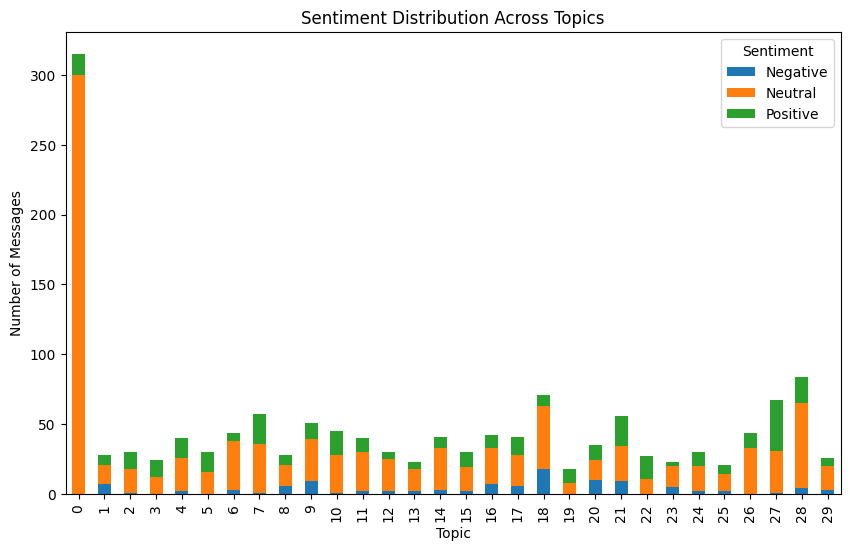

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
from textblob import TextBlob
from gensim import corpora, models

# Assuming df is already created and contains a 'message' column

# Function to categorize sentiment
def get_sentiment(text):
    analysis = TextBlob(text)
    if analysis.sentiment.polarity > 0.1:
        return 'Positive'
    elif analysis.sentiment.polarity < -0.1:
        return 'Negative'
    else:
        return 'Neutral'

# Apply sentiment analysis
cleaned_df['sentiment'] = cleaned_df['message'].apply(get_sentiment)

# Preparing text data from DataFrame
texts = [message.lower().split() for message in cleaned_df['message']]

# Creating a dictionary and corpus
dictionary = corpora.Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]

# Applying LDA
lda_model = models.LdaModel(corpus, num_topics=30, id2word=dictionary, passes=15)

# Preparing topic descriptions
topic_descriptions = {i: ', '.join([word for word, _ in lda_model.show_topic(i, topn=5)])
                      for i in range(lda_model.num_topics)}

# Function to assign dominant topics
def assign_topics(texts, dictionary, model):
    topics = []
    for text in texts:
        bow = dictionary.doc2bow(text)
        topic_distribution = model.get_document_topics(bow)
        dominant_topic = sorted(topic_distribution, key=lambda x: x[1], reverse=True)[0][0]
        topics.append(dominant_topic)
    return topics

# Assign topics to messages
cleaned_df['dominant_topic'] = assign_topics(texts, dictionary, lda_model)

# Map topic descriptions
cleaned_df['topic_description'] = cleaned_df['dominant_topic'].map(topic_descriptions)

# Display the DataFrame
print(cleaned_df)

# Analyze sentiment distribution per topic
sentiment_distribution = cleaned_df.groupby(['dominant_topic', 'sentiment']).size().unstack(fill_value=0)

# Plotting sentiment distribution
sentiment_distribution.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Sentiment Distribution Across Topics')
plt.xlabel('Topic')
plt.ylabel('Number of Messages')
plt.legend(title='Sentiment')
plt.show()


                                                message  \
0                                                         
1                                               explain   
2     course 'd happy help Could please provide cont...   
3     Example One might expect X jointly continuous ...   
4     Certainly Let 's break explanation 1 Joint Con...   
...                                                 ...   
1436                                                      
1437  /quick_fix git rebase accept remote changes pa...   
1438  `` bash git checkout -- package-lock.json git ...   
1439                                             thanks   
1440  're welcome questions need assistance feel fre...   

                    create_time       role sentiment  dominant_topic  \
0                           NaT     system   Neutral               0   
1    2024-04-29 18:32:01.211017       user   Neutral              14   
2    2024-04-29 18:32:05.624934  assistant  Positive              22   
3  

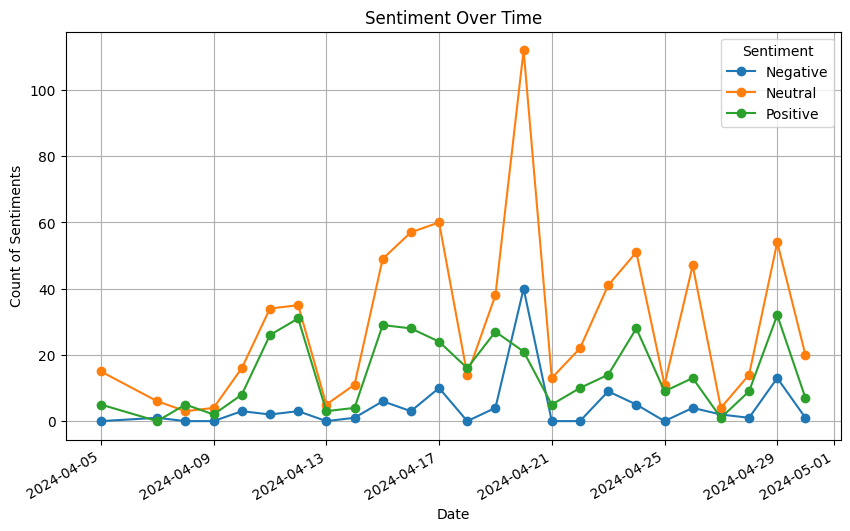

In [10]:
import pandas as pd
import matplotlib.pyplot as plt

# Ensure the 'create_time' column is datetime type
# cleaned_df['create_time'] = pd.to_datetime(cleaned_df['create_time'])

# Group by desired time interval (e.g., daily)
# You can change 'D' to 'H' for hourly, 'M' for monthly, etc.
print(cleaned_df)
cleaned_df['sentiment'] = cleaned_df['sentiment'].astype(str)
cleaned_df = cleaned_df.dropna() # Removed blank entries

time_grouped = cleaned_df.groupby(pd.Grouper(key='create_time', freq='D'))

# Aggregate sentiment counts per period
print(time_grouped['sentiment'].value_counts())
sentiment_counts = time_grouped['sentiment'].value_counts().unstack(fill_value=0)

# Plotting the results
sentiment_counts.plot(kind='line', figsize=(10, 6), marker='o')
plt.title('Sentiment Over Time')
plt.xlabel('Date')
plt.ylabel('Count of Sentiments')
plt.legend(title='Sentiment')
plt.grid(True)
plt.show()

sentiment       Negative  Neutral  Positive
dominant_topic                             
0                      0       60        15
1                      7       14         7
2                      1       17        12
3                      0       12        12
4                      2       24        14
5                      0       16        14
6                      3       35         6
7                      1       35        21
8                      6       15         7
9                      9       30        12
10                     1       27        17
11                     2       28        10
12                     2       23         5
13                     2       16         5
14                     3       30         8
15                     2       17        11
16                     7       26         9
17                     6       22        13
18                    18       45         8
19                     0        8        10
20                    10       1

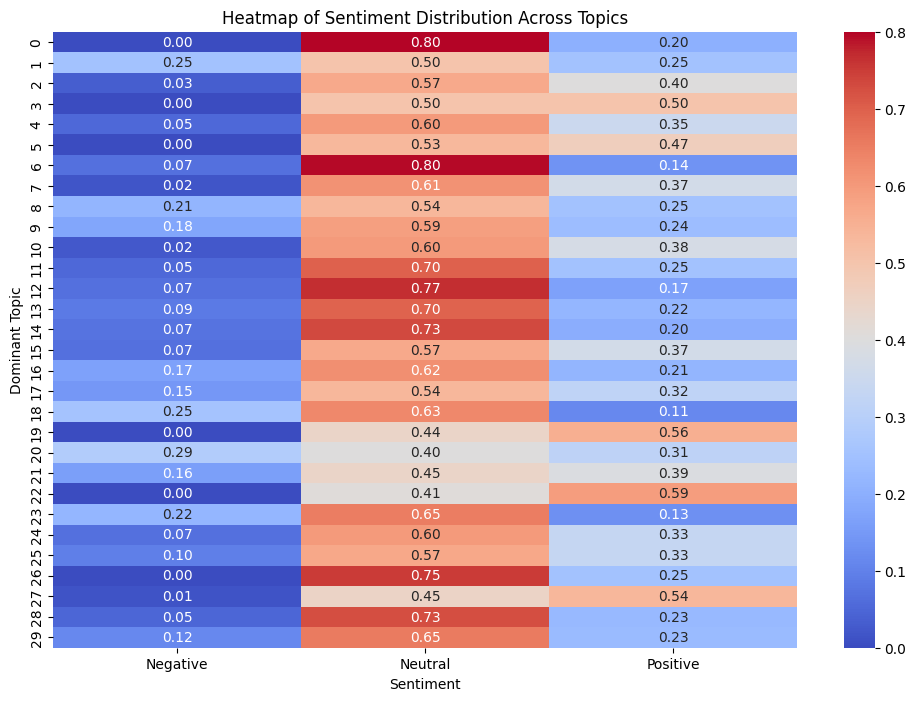

In [11]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'dominant_topic' and 'sentiment' are already in your DataFrame
topic_sentiment_distribution = pd.crosstab(cleaned_df['dominant_topic'], cleaned_df['sentiment'])
print(topic_sentiment_distribution)

topic_sentiment_distribution_normalized = topic_sentiment_distribution.div(topic_sentiment_distribution.sum(axis=1), axis=0)

# Heatmap of the sentiment distribution across topics
plt.figure(figsize=(12, 8))
sns.heatmap(topic_sentiment_distribution_normalized, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Heatmap of Sentiment Distribution Across Topics')
plt.xlabel('Sentiment')
plt.ylabel('Dominant Topic')
plt.show()


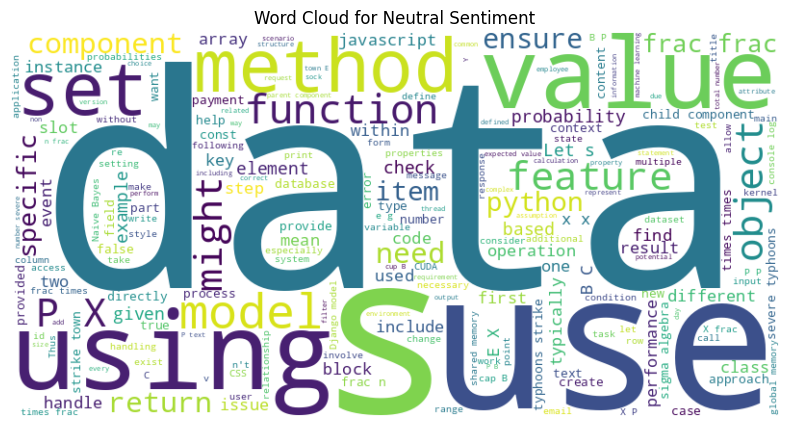

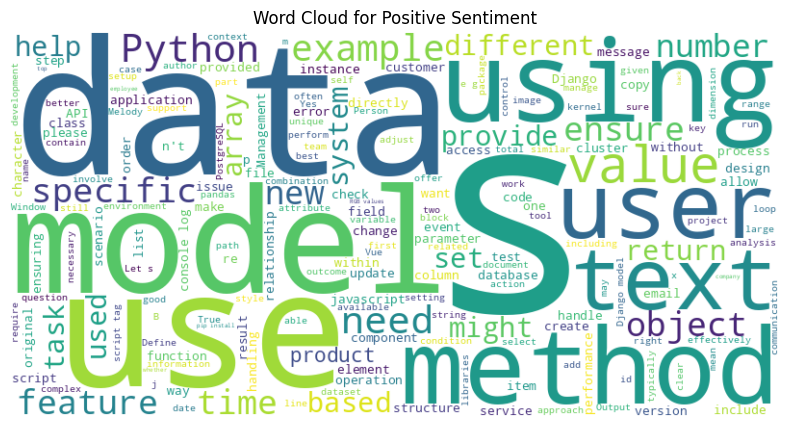

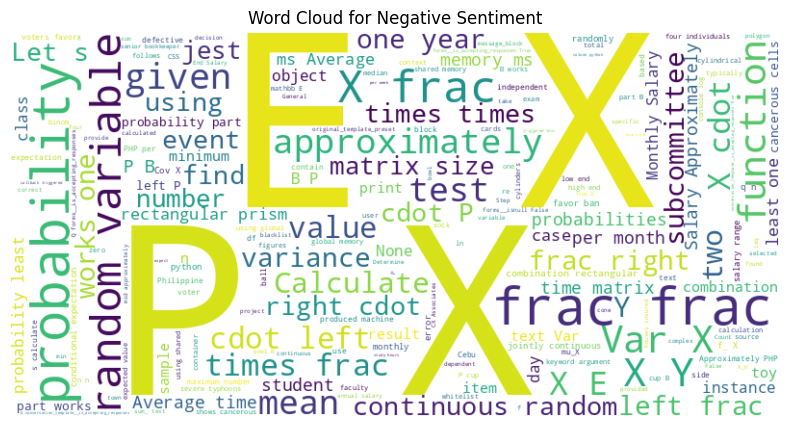

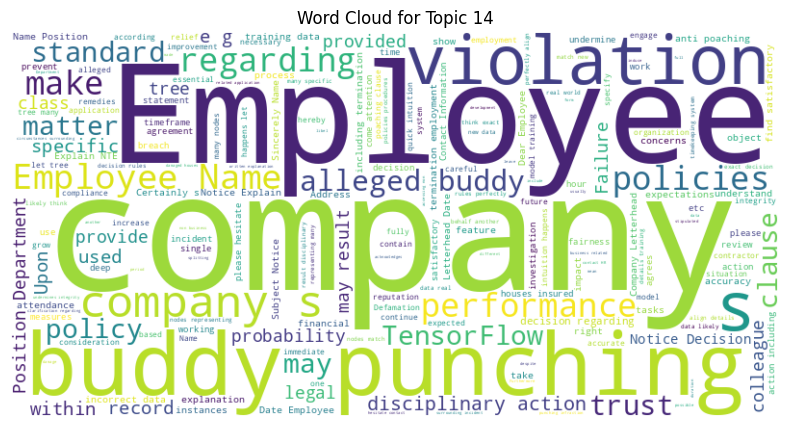

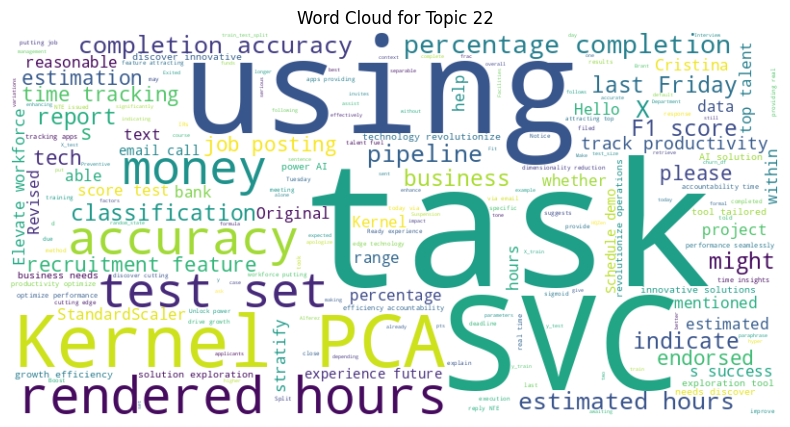

...

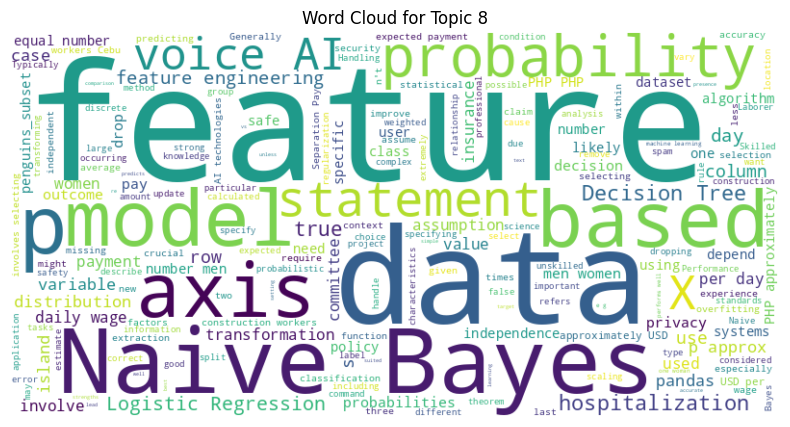

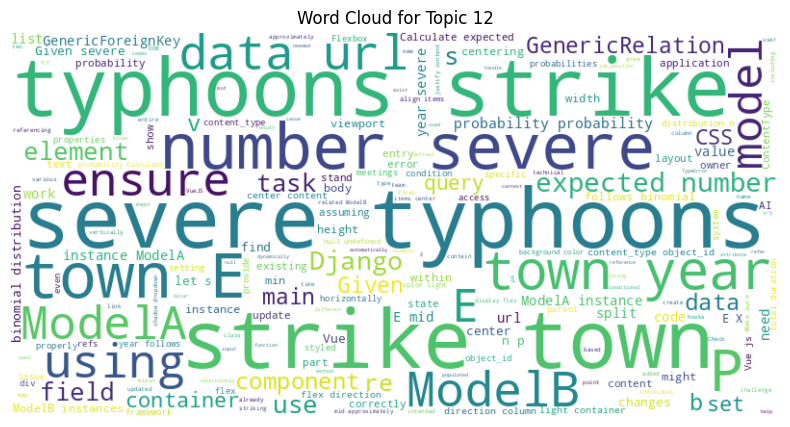

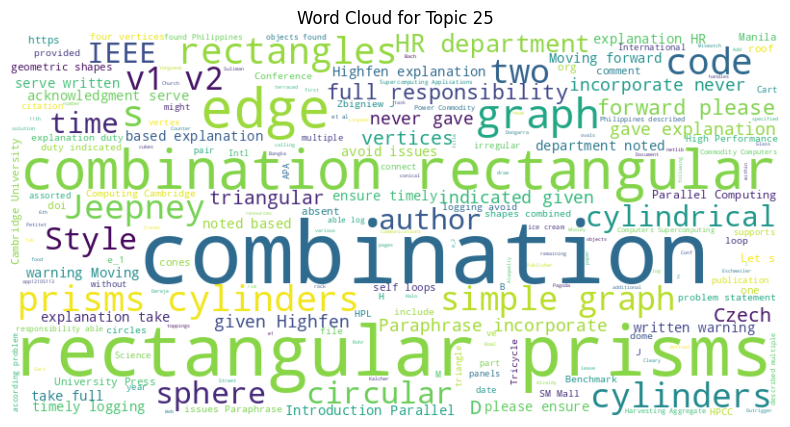

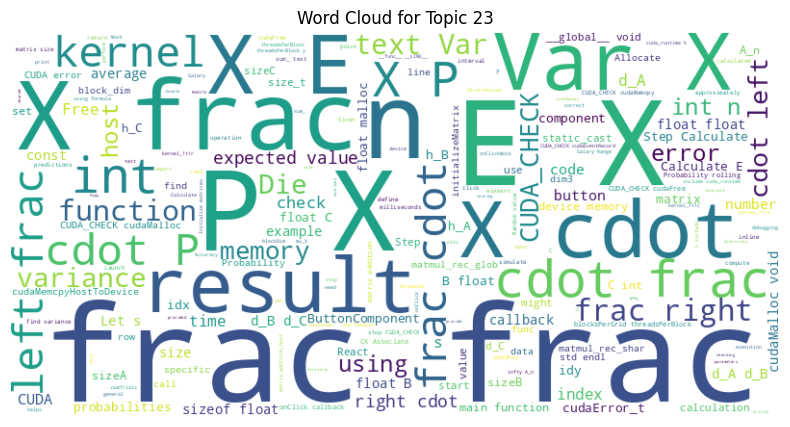

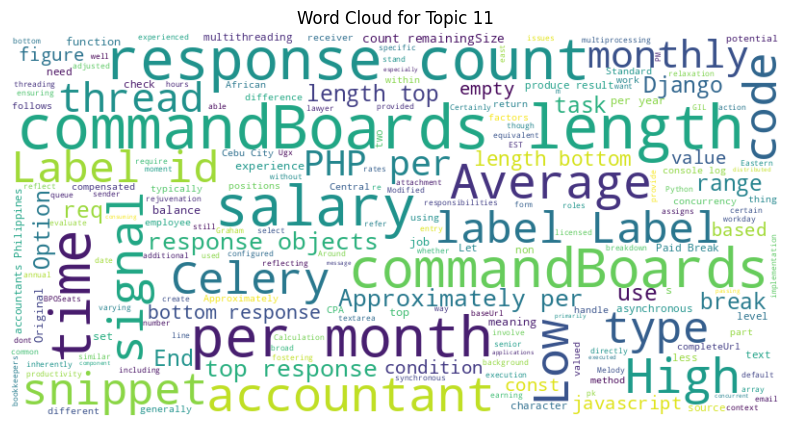

In [12]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Function to generate and display a word cloud
def generate_word_cloud(text, title):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(title)
    plt.axis("off")
    plt.show()

# Generate word clouds for each sentiment category
for sentiment in cleaned_df['sentiment'].unique():
    # Filter the DataFrame by sentiment
    subset = cleaned_df[cleaned_df['sentiment'] == sentiment]
    # Combine all texts in the subset
    text = " ".join(message for message in subset['message'])
    # Generate and display the word cloud
    generate_word_cloud(text, f"Word Cloud for {sentiment} Sentiment")

# Generate word clouds for each topic
for topic in cleaned_df['dominant_topic'].unique():
    # Filter the DataFrame by topic
    subset = cleaned_df[cleaned_df['dominant_topic'] == topic]
    # Combine all texts in the subset
    text = " ".join(message for message in subset['message'])
    # Generate and display the word cloud
    generate_word_cloud(text, f"Word Cloud for Topic {topic}")


In [13]:
# import pandas as pd

# # Assuming df is your DataFrame and it has 'conversation_id', 'timestamp', 'dominant_topic', and 'sentiment'
# # Ensure the data is sorted
# cleaned_df['conversation_id'] = cleaned_df.index
# cleaned_df.sort_values(['conversation_id', 'create_time'], inplace=True)
# print(cleaned_df)

# # Shift the 'dominant_topic' and 'sentiment' columns within each group to get the next message's topic and sentiment
# cleaned_df['next_dominant_topic'] = cleaned_df.groupby('conversation_id')['dominant_topic'].shift(-1)
# cleaned_df['next_sentiment'] = cleaned_df.groupby('conversation_id')['sentiment'].shift(-1)

# # Drop any rows with NaN in the 'next' columns which will appear at the end of each conversation
# cleaned_df.dropna(subset=['next_dominant_topic', 'next_sentiment'], inplace=True)

# # Calculate transitions as tuples (can be from topic to topic, sentiment to sentiment, or mixed)
# cleaned_df['transition'] = list(zip(cleaned_df['dominant_topic'], cleaned_df['next_dominant_topic'], cleaned_df['sentiment'], cleaned_df['next_sentiment']))

# # Count the occurrences of each transition
# transition_counts = cleaned_df['transition'].value_counts().reset_index()
# transition_counts.columns = ['transition', 'count']

# # Example print to see what the transitions look like
# print(transition_counts)

In [14]:
import plotly.graph_objects as go

# Function to create a Sankey diagram from nodes and links
def create_sankey(labels, source, target, values, title):
    fig = go.Figure(data=[go.Sankey(
        node=dict(
            pad=15,
            thickness=20,
            line=dict(color="black", width=0.5),
            label=labels
        ),
        link=dict(
            source=source,  # indices of source nodes
            target=target,  # indices of target nodes
            value=values    # values of links
        ))])

    fig.update_layout(title_text=title, font_size=10)
    fig.show()

# Example Data Preparation
# You will need to replace this with your actual transition calculation
labels = ['Topic 1', 'Topic 2', 'Positive', 'Negative', 'Neutral']
source = [0, 1, 0, 1, 0, 2, 3, 4]  # Example indices for source nodes
target = [2, 2, 3, 4, 3, 1, 0, 1]  # Example indices for target nodes
values = [10, 5, 15, 5, 10, 10, 5, 5]  # Example values for each flow

# Create and display the Sankey diagram
create_sankey(labels, source, target, values, "Sankey Diagram: Topic and Sentiment Transitions")


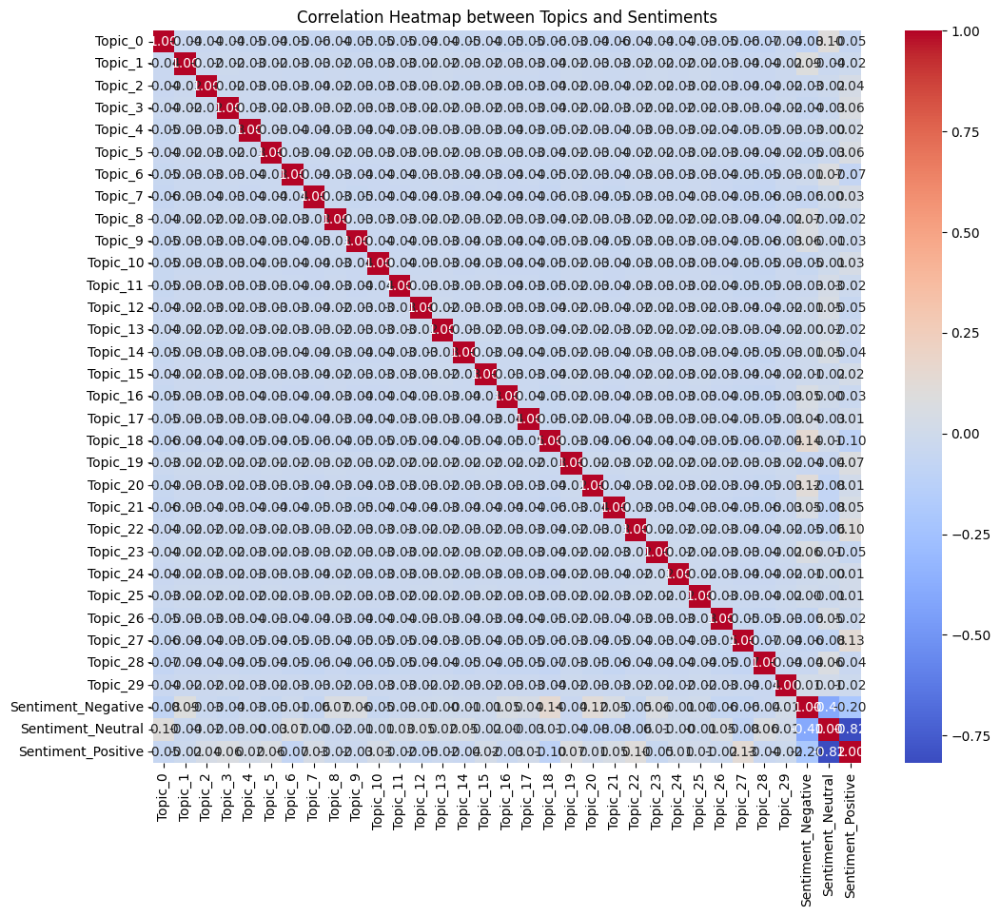

In [16]:
import pandas as pd

# Assuming df already contains 'dominant_topic' and 'sentiment'
# Create dummy variables for topics and sentiments
topic_dummies = pd.get_dummies(cleaned_df['dominant_topic'], prefix='Topic')
sentiment_dummies = pd.get_dummies(cleaned_df['sentiment'], prefix='Sentiment')

# Combine the dummies into a single DataFrame
analysis_df = pd.concat([topic_dummies, sentiment_dummies], axis=1)

correlation_matrix = analysis_df.corr()

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Heatmap between Topics and Sentiments')
plt.show()

In [15]:
# import tensorflow as tf### models
# import numpy as np### math computations
# import matplotlib.pyplot as plt### plotting bar chart
# import sklearn### machine learning library
# import cv2## image processing
# from sklearn.metrics import confusion_matrix, roc_curve### metrics
# import seaborn as sns### visualizations
# import datetime # For Datetime Functions
# import pathlib # handling files and paths on your operating system
# import io # dealing with various types of I/O
# import os 
# import re # for Regular Expressions
# import string
# import time
# from numpy import random
# import gensim.downloader as api # to download pre-trained model datasets and word embeddings from Gensim's repository
# from PIL import Image # manipulating images, resizing, cropping, adding text
# import tensorflow_datasets as tfds # Tf Datasets
# import tensorflow_probability as tfp
# from tensorflow.keras.models import Model
# from tensorflow.keras.layers import Layer
# from tensorflow.keras.layers import (Dense,Flatten,InputLayer,BatchNormalization,
#                                      Dropout,Input,LayerNormalization)
# from tensorflow.keras.losses import (BinaryCrossentropy,CategoricalCrossentropy,
#                                     SparseCategoricalCrossentropy)
# from tensorflow.keras.metrics import (Accuracy,TopKCategoricalAccuracy,
#                                  CategoricalAccuracy, SparseCategoricalAccuracy)
# from tensorflow.keras.optimizers import Adam
# from google.colab import drive
# from google.colab import files
# from datasets import load_dataset
# from transformers import (BertTokenizerFast,TFBertTokenizer,BertTokenizer,RobertaTokenizerFast, DataCollatorWithPadding,TFRobertaForSequenceClassification,TFBertForSequenceClassification,TFBertModel,create_optimizer)

# BATCH_SIZE=8

# tr_df = pd.DataFrame({'messages': cleaned_messages, 'sentiment': [0 for m in cleaned_messages]})